# CVSN Assignment 3

- Sampad Kumar Kar (100%)
- MCS202215

In [1]:
import cv2

import numpy as np

import matplotlib.pyplot as plt

# for file handling
import os
import glob

In [2]:
# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

In [3]:
# we define a helper function to print the image using `matplotlib`

# this prints colored image
def print_image(img, isGray=False, title="Image"):
    # OpenCV reads images in BGR, and matplotlib reads images in RGB
    # so, we switch the color channels using `cvtColor` method
    
    # if isGray = True, we first grayscale the image using the same `cvtColor` method
    if isGray:
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img_colored = cv2.cvtColor(img_gray, cv2.COLOR_BGR2RGB)
    else:
        img_colored = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(10,6))
    plt.imshow(img_colored)
    plt.axis(False)
    plt.title(title)
    plt.show()


In [4]:
# helper function to extract pointer click coordinates from an image

# Define the callback function for mouse events
def on_mouse(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        print("Mouse clicked at:", x, y)

def extract_pointer_coordinates(img_path):
    img = cv2.imread(img_path)

    # print message
    print("Left Click on the image to exract the coordinates of the click. Press any key to exit.")

    # create window to display image
    cv2.namedWindow("image", cv2.WINDOW_NORMAL)

    # assign the callback function to the window
    cv2.setMouseCallback("image", on_mouse)

    # display the image
    cv2.imshow("image", img)

    # press any key to exit
    cv2.waitKey(0)

    # close the window
    cv2.destroyAllWindows()

# 0.

In [5]:
CheckerBoard_folderpath = os.path.join('data', 'Images', 'CheckerBoards')
print(CheckerBoard_folderpath)
DotGrid_folderpath = os.path.join('data', 'Images', 'DotGrids')
print(DotGrid_folderpath)

data/Images/CheckerBoards
data/Images/DotGrids


# Checker Board

In [6]:
CheckerBoard_imagepaths = glob.glob(os.path.join(CheckerBoard_folderpath, '*.jpeg'))
DotGrid_imagepaths = glob.glob(os.path.join(DotGrid_folderpath, '*.jpeg'))

In [26]:
print("# Images:", len(CheckerBoard_imagepaths))
print(CheckerBoard_imagepaths)

# Images: 10
['data/Images/CheckerBoards/0.jpeg', 'data/Images/CheckerBoards/1.jpeg', 'data/Images/CheckerBoards/6.jpeg', 'data/Images/CheckerBoards/7.jpeg', 'data/Images/CheckerBoards/8.jpeg', 'data/Images/CheckerBoards/4.jpeg', 'data/Images/CheckerBoards/5.jpeg', 'data/Images/CheckerBoards/9.jpeg', 'data/Images/CheckerBoards/2.jpeg', 'data/Images/CheckerBoards/3.jpeg']


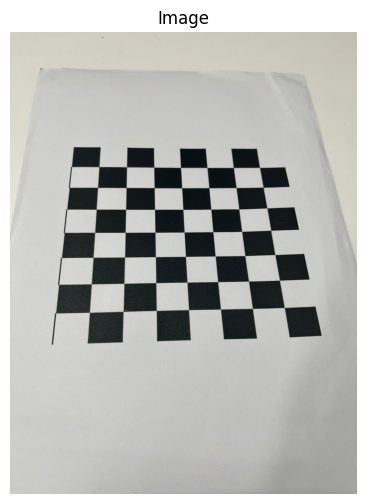

Height: 1600
Width 1200


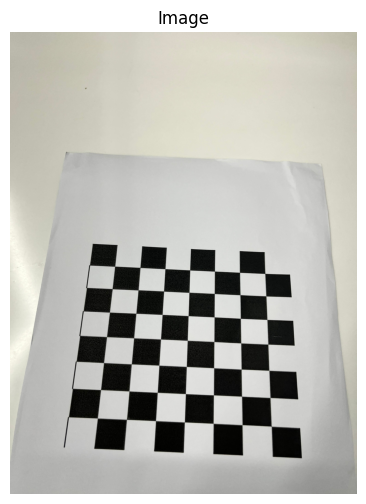

Height: 1600
Width 1200


In [72]:
# visualizing these images

rand_idx = np.random.randint(len(CheckerBoard_imagepaths), size=2)
for idx in rand_idx:
    img = cv2.imread(CheckerBoard_imagepaths[idx])
    h,w,c = img.shape
    print_image(img)
    print("Height:", h)
    print("Width", w)

# 1., 2.

First, we try extarcting the refined co-ordinates of the corner points in the Image Co-ordinate Frame in all the images.

In [35]:
def draw_corner_pts(imgpath):
    img = cv2.imread(imgpath)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # extract corners
    ret, corners = cv2.findChessboardCorners(image=img_gray, patternSize=(7,7))
    
    if ret:
        # refining using `cornerSubPix`
        corners2 = cv2.cornerSubPix(img_gray, corners, (11,11), (-1,1), criteria)

        img_drawn = img.copy()
        img_drawn = cv2.drawChessboardCorners(image=img_drawn, patternSize=(7,7), corners=corners2, patternWasFound=ret)

        # Draw and display original image vs corner drawn image
        plt.figure(figsize=(10,10))
        
        plt.subplot(121)
        plt.imshow(img)
        plt.title("Original")
        
        plt.subplot(122)
        plt.imshow(img_drawn)
        plt.title("Corner Drawn")

        plt.show()
    
    return corners2


Also, in the World Co-ordinate Frame, we consider the top-left corner of the chess board as the origin point. Secondly, the `z` co-ordinate of all the points are assumed to be `0`. So, every corner coordinate will look like $(m_{x}a, m_{y}a, 0)$, where $m_{x}, m_{y} \in \mathbb{N}$ and $a = 2$ cm.

In [37]:
# the length of each small square is 2cm

def extract_corner_pts(image_filepath_list, a=2, patternSize=(7,7)):
    n_imgs = len(image_filepath_list)
    
    # preparing corner coordinate points in World Co-ordinate Frame (this is same for every image)
    objpts = np.zeros((patternSize[0]*patternSize[1],3), np.float32)
    objpts[:,:2] = a*(np.mgrid[0:patternSize[0], 0:patternSize[1]].T.reshape(-1,2))

    # initialize and store all the corner point co-ordinates in WCF and ICF of each image in these lists
    combined_objpts = [objpts for _ in range(n_imgs)]
    combined_imgpts = []

    for imgpath in image_filepath_list:
        # extract and draw the refned corner co-ordinates
        corner_refined = draw_corner_pts(imgpath)

        # store the extracted corner point co-ordinates in ICF
        combined_imgpts.append(corner_refined)
    
    return combined_objpts, combined_imgpts

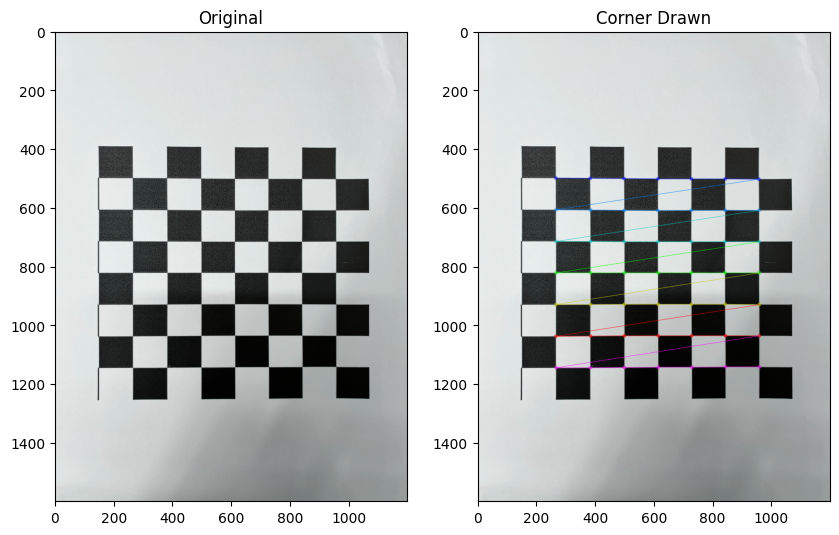

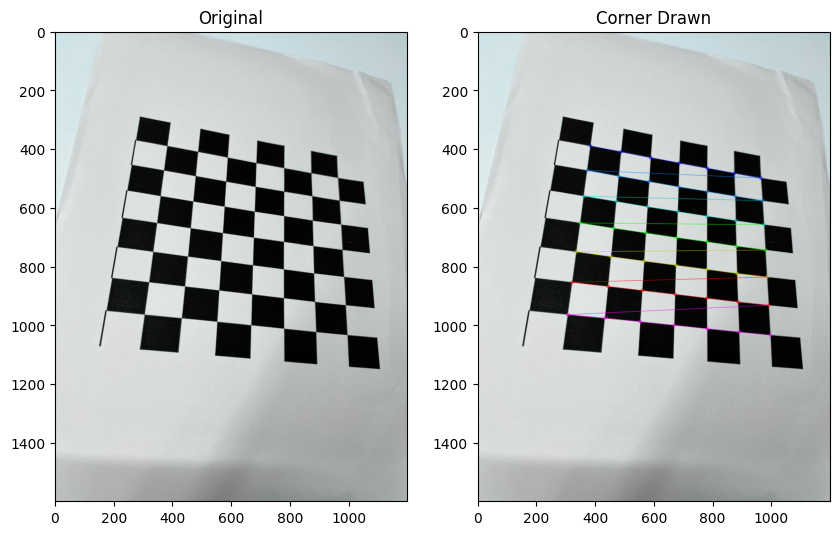

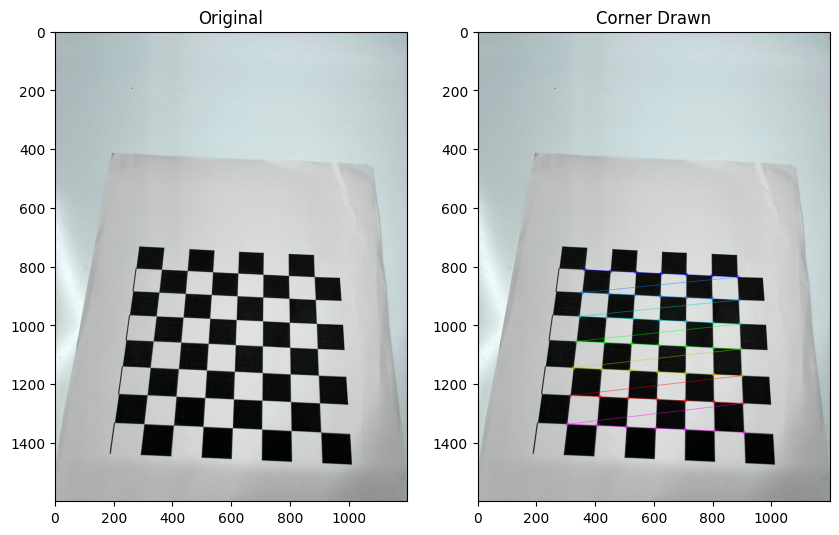

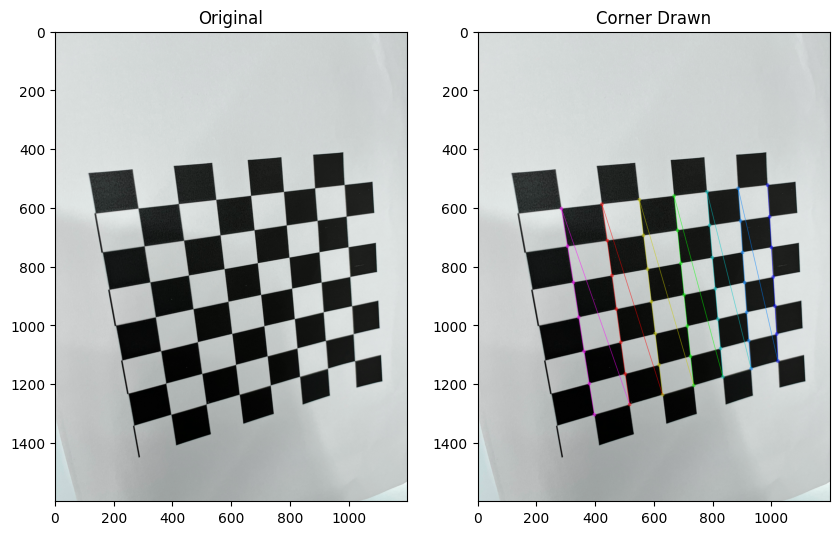

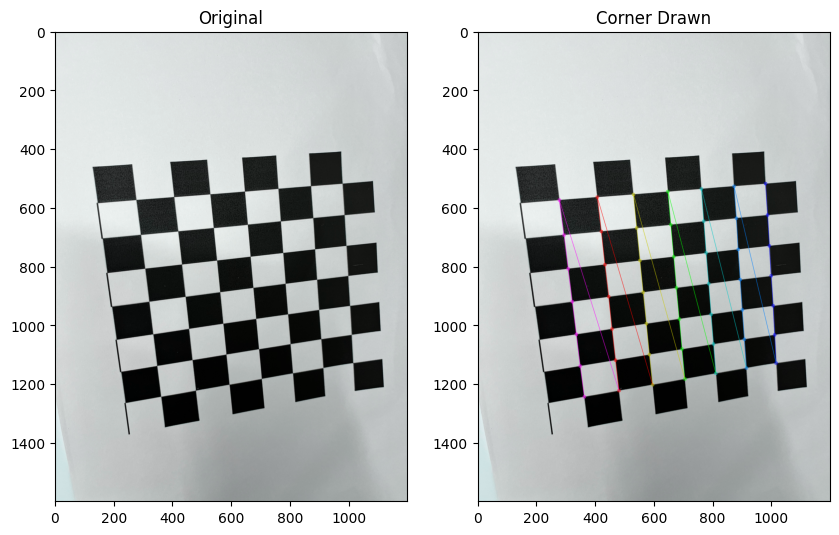

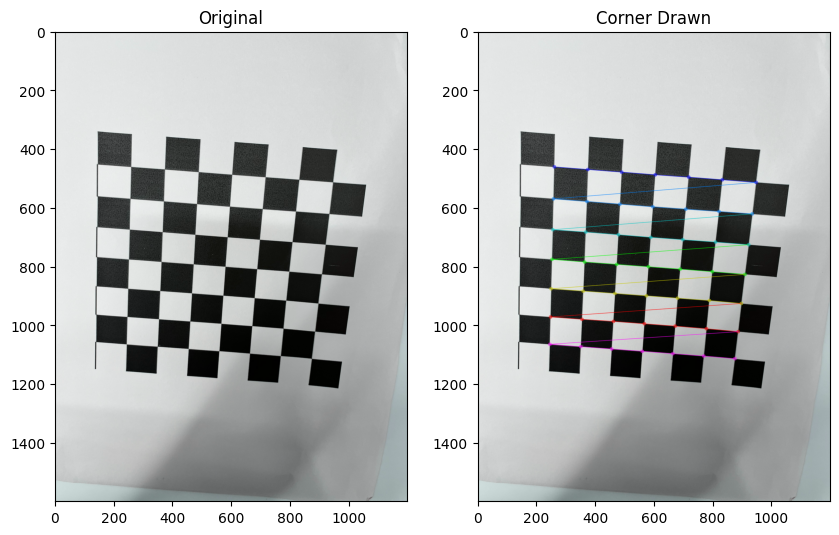

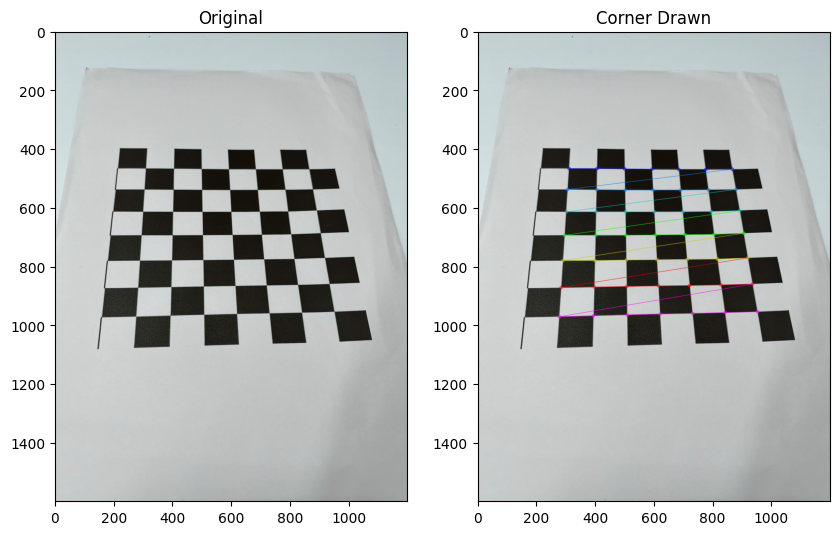

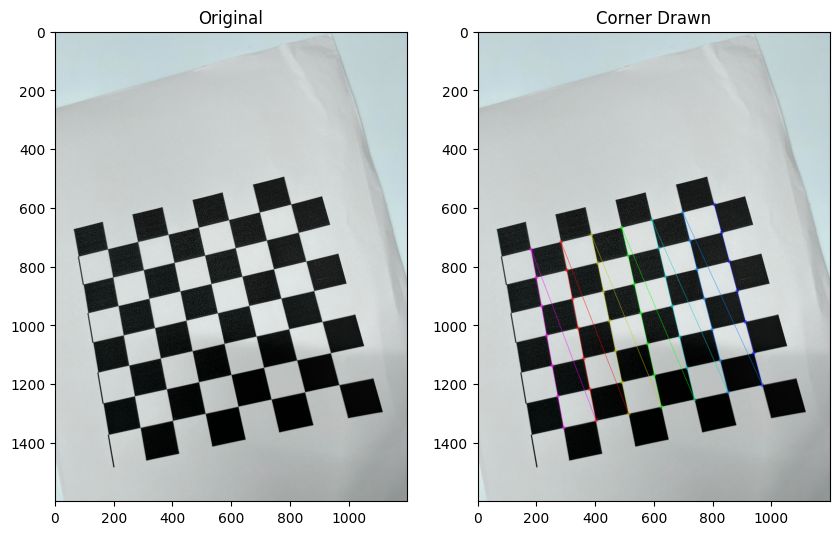

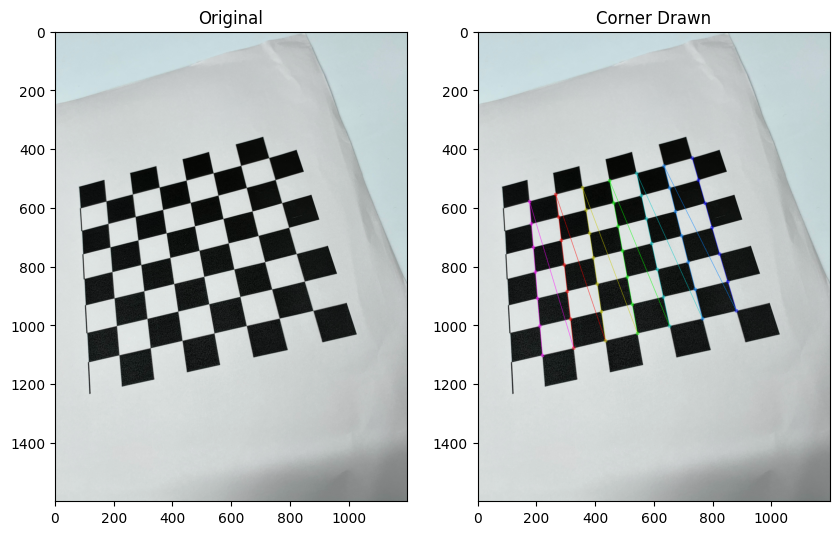

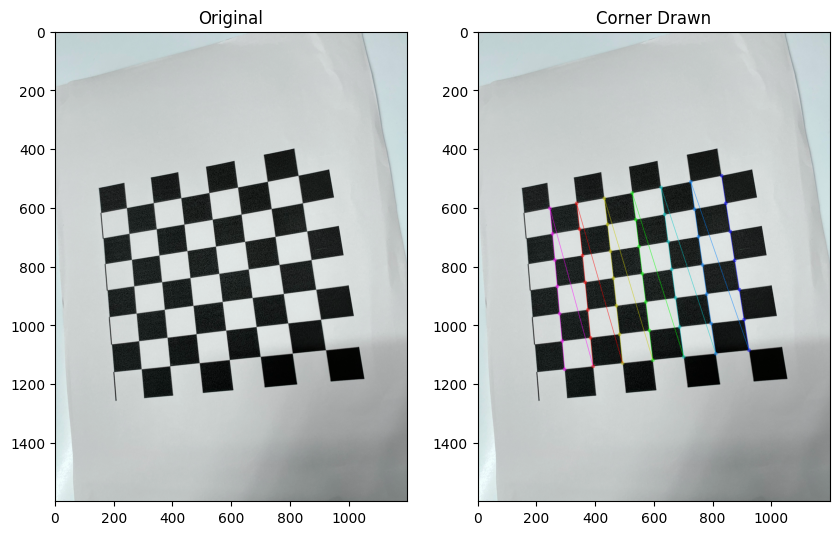

In [38]:
combined_objpts, combined_imgpts = extract_corner_pts(CheckerBoard_imagepaths)

# 3.

Now, using the correspondences obtained above for each image, we calibrate the camera.

In [41]:
img = cv2.imread(CheckerBoard_imagepaths[0])
h,w,_ = img.shape
print("Height:", h)
print("Width:", w)

Height: 1600
Width: 1200


In [42]:
yret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(combined_objpts, combined_imgpts, (w,h), None, None)
print(f'The camera matrix is :')    # Camera matrix
for rows in mtx:
    s=""
    for val in rows:
        s+=f'    {val:4.4f}'
    print(s)

print('\n\nThe Distortion parameters are: ')
for i in dist:
    print('\t'.join(map(str, np.round(i,4))))

The camera matrix is :
    1491.7782    0.0000    609.4575
    0.0000    1390.9183    792.0688
    0.0000    0.0000    1.0000


The Distortion parameters are: 
0.3264	-2.8475	-0.0017	-0.0053	8.2776


We undistort the images and print them side by side.

In [43]:
# we define the new camera-matrix based on the estimated camera matrix and the distortion parameters
new_camera_mtx, roi = cv2.getOptimalNewCameraMatrix(
    cameraMatrix=mtx,
    distCoeffs=dist,
    imageSize=(w,h),
    alpha=1,
    newImgSize=(w,h)
)

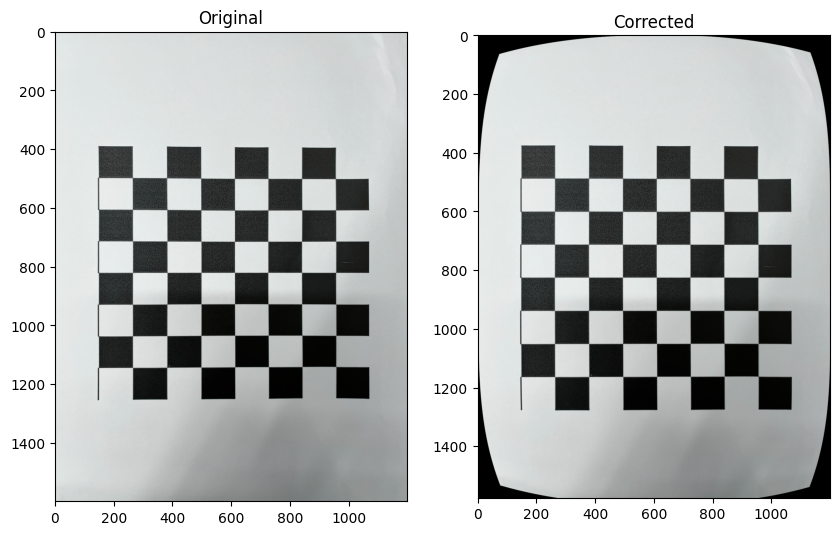

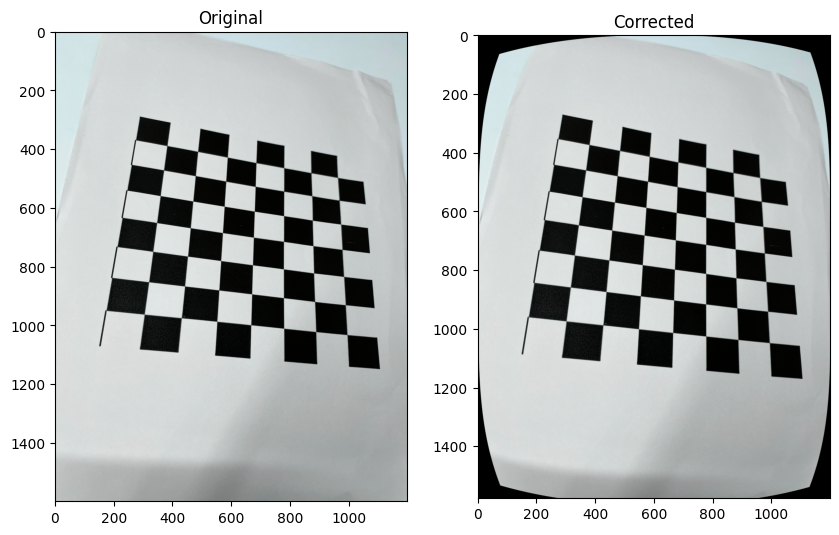

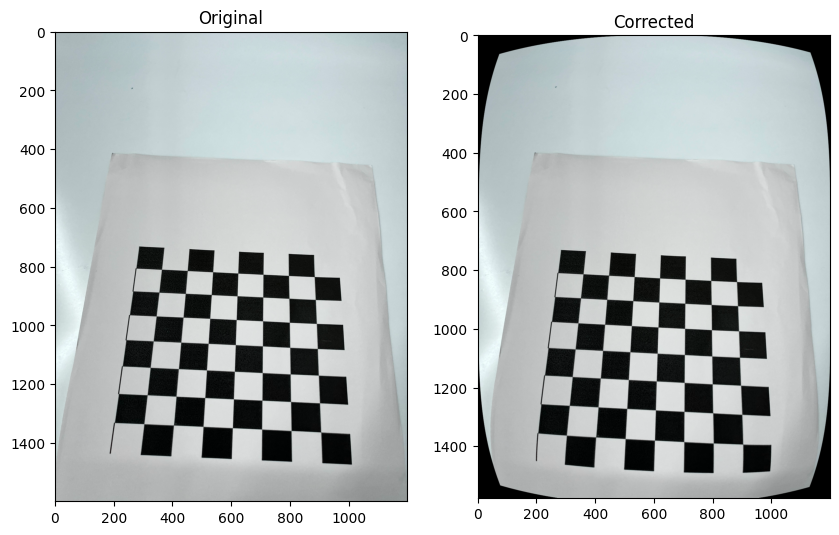

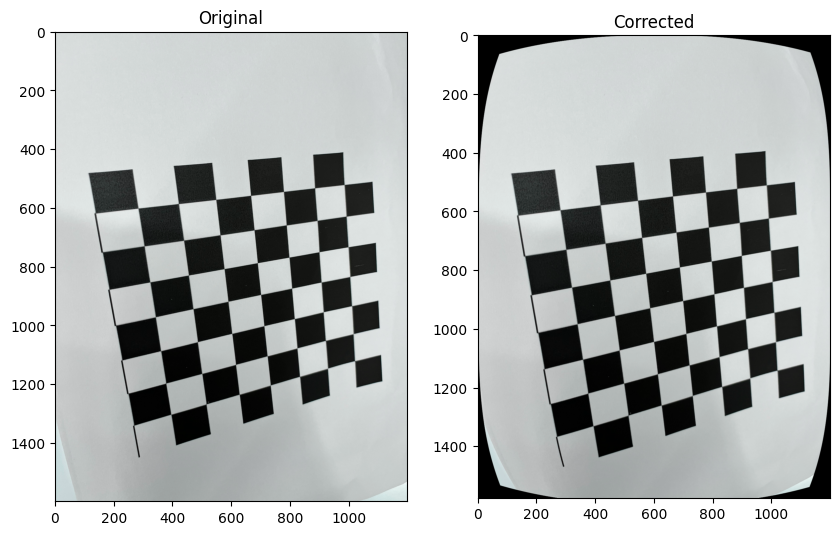

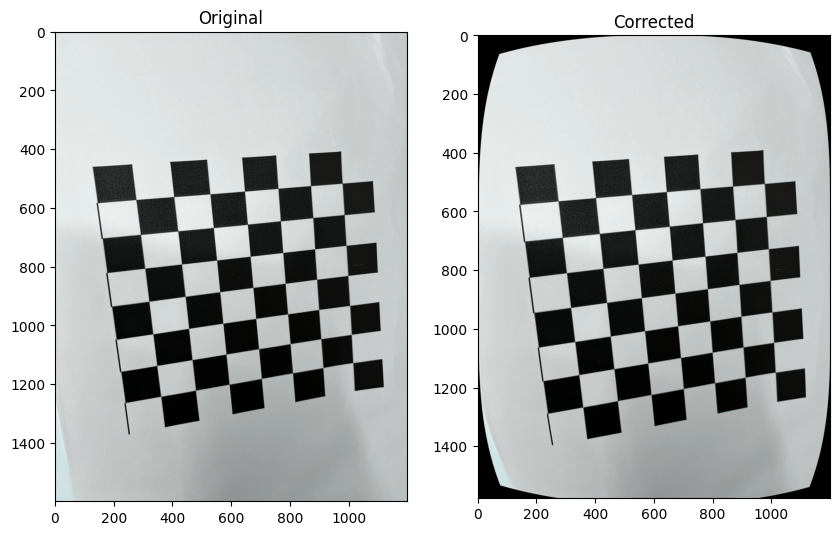

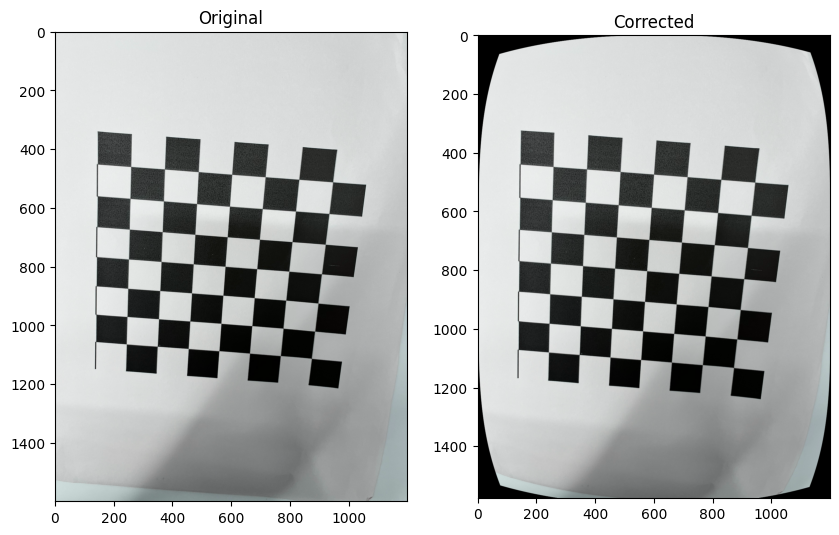

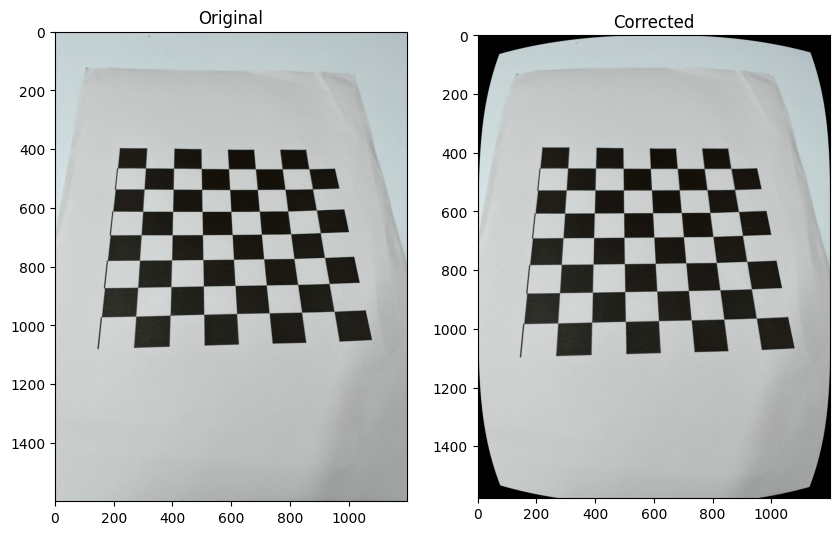

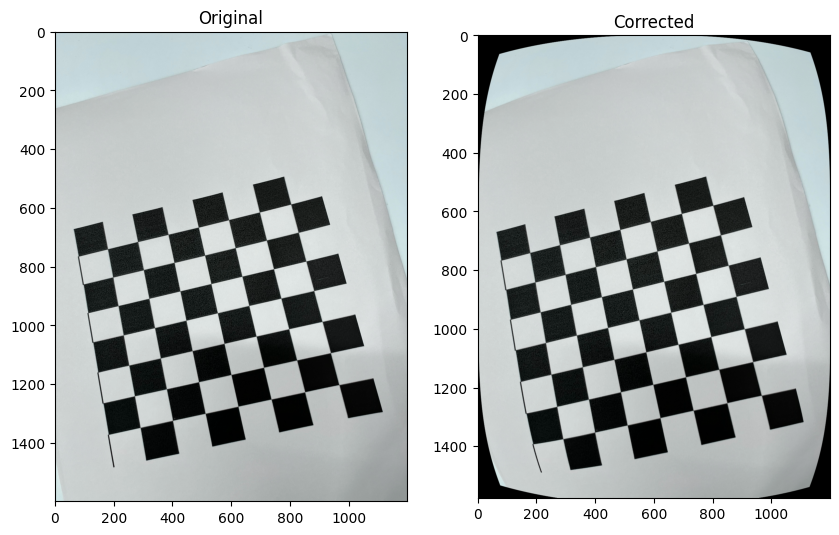

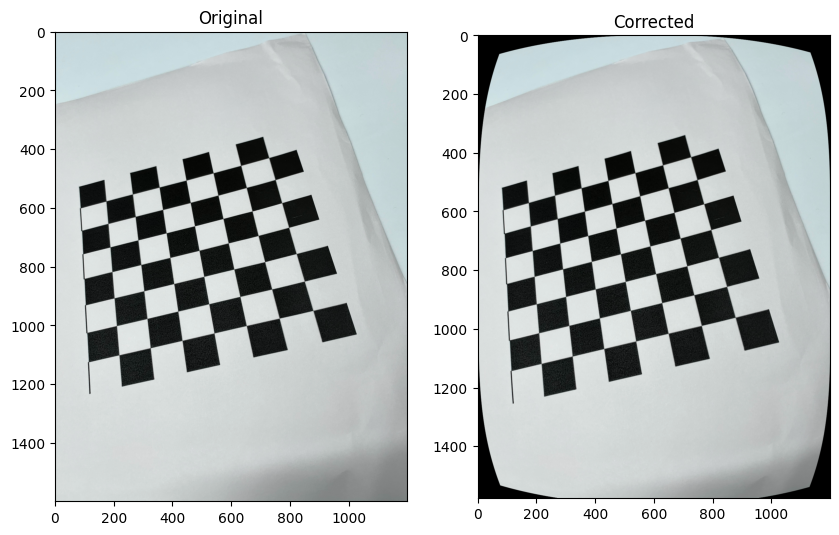

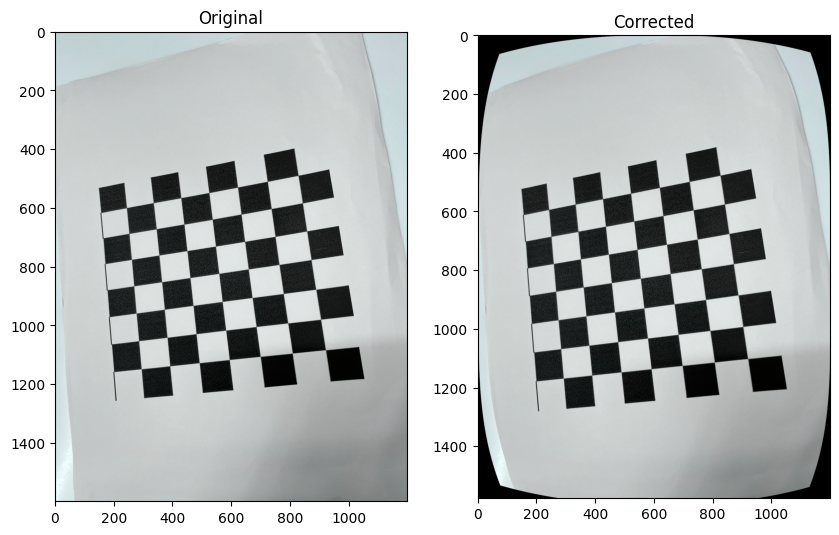

In [44]:
for imgpath in CheckerBoard_imagepaths:
    img = cv2.imread(imgpath)
    
    # undistorted image
    img_undist = cv2.undistort(img, mtx, dist, None, new_camera_mtx)

    # crop the image
    dx, dy, x, y = roi
    #img_undist = img_undist[dy:dy+y, dx:dx+x]
    img_undist = img_undist[0:dy+y+dy, 0:dx+x+dx]

    # Draw and display original image vs corner drawn image
    plt.figure(figsize=(10,10))
    
    plt.subplot(121)
    plt.imshow(img)
    plt.title("Original")
    
    plt.subplot(122)
    plt.imshow(img_undist)
    plt.title("Corrected")

    plt.show()

# 4.

We calculate the reprojection error.

In [45]:
# mean reprojection error

error_sum = 0

for i in range(len(combined_objpts)):
    imgpt_hat, _ = cv2.projectPoints(combined_objpts[i], rvecs[i], tvecs[i], mtx, dist)

    curr_error = cv2.norm(combined_imgpts[i], imgpt_hat, cv2.NORM_L2)/len(imgpt_hat)

    error_sum += curr_error

print("Mean Reprojection Error:", error_sum/len(combined_objpts))

Mean Reprojection Error: 0.19575283419029427


# Dot Grid

In [7]:
print("# Images:", len(DotGrid_imagepaths))
print(DotGrid_imagepaths)

# Images: 10
['data/Images/DotGrids/0.jpeg', 'data/Images/DotGrids/1.jpeg', 'data/Images/DotGrids/6.jpeg', 'data/Images/DotGrids/7.jpeg', 'data/Images/DotGrids/8.jpeg', 'data/Images/DotGrids/4.jpeg', 'data/Images/DotGrids/5.jpeg', 'data/Images/DotGrids/9.jpeg', 'data/Images/DotGrids/2.jpeg', 'data/Images/DotGrids/3.jpeg']


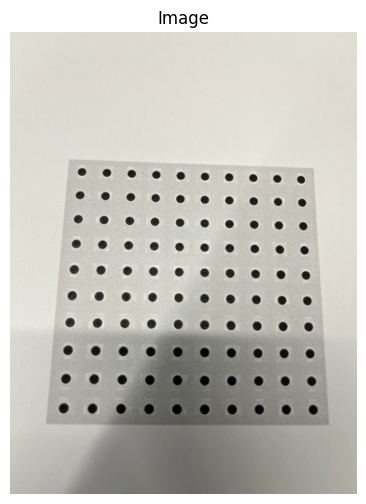

Height: 1600
Width 1200


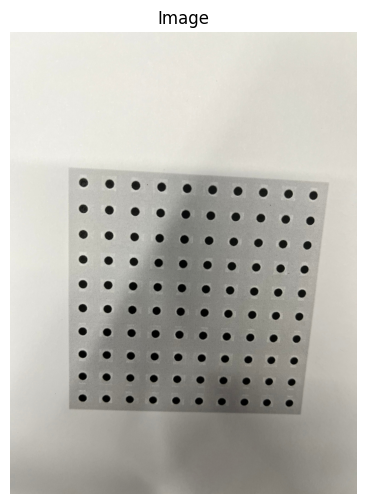

Height: 1600
Width 1200


In [8]:
# visualizing these images

rand_idx = np.random.randint(len(DotGrid_imagepaths), size=2)
for idx in rand_idx:
    img = cv2.imread(DotGrid_imagepaths[idx])
    h,w,c = img.shape
    print_image(img)
    print("Height:", h)
    print("Width", w)

# 5.

Using the DotGrids images, we do "Blob Detection" to find the point correspondences in each of the images.

In [48]:
# parameters to capture blobs

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001) 
blobParams = cv2.SimpleBlobDetector_Params()

# Create a detector with the parameters
blobDetector = cv2.SimpleBlobDetector_create(blobParams)

We first use `blobDetector` to collect all the blobs/key-points in the image and display them by using the `cv2.drawKeypoints` function.

In [54]:
def draw_key_pts(imgpath, patternSize=(10,10)):
    img = cv2.imread(imgpath)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # collect blobs/keypoints
    keypoints = blobDetector.detect(img_gray)

    # draw refined-keypoints on the image
    img_drawn = cv2.drawKeypoints(img, keypoints, np.array([]), (255,0,0), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # convert key-points drawn image to grascale
    img_drawn_gray = cv2.cvtColor(img_drawn, cv2.COLOR_BGR2GRAY)

    # extract blob coordinates, find the circle grids
    ret, corners = cv2.findCirclesGrid(img_drawn_gray, patternSize, None, flags=cv2.CALIB_CB_SYMMETRIC_GRID)

    if ret:
        # refining using `cornerSubPix`
        keypoints2 = cv2.cornerSubPix(img_gray, corners, patternSize, (-1,-1), criteria)

        img_drawn = img.copy()
        img_drawn = cv2.drawChessboardCorners(image=img_drawn, patternSize=patternSize, corners=keypoints2, patternWasFound=ret)
    
        # Draw and display original image vs blob drawn image
        plt.figure(figsize=(10,10))
        
        plt.subplot(121)
        plt.imshow(img)
        plt.title("Original")
        
        plt.subplot(122)
        plt.imshow(img_drawn)
        plt.title("Blobs Drawn")

        plt.show()
    
    return keypoints2

Now, we use `cv2.findCirclesGrid` to find `ret, corners` similar to `cv2.findChessboardCorners` above.

In [57]:
# the distance between each of dots is 0.75cm

def extract_blob_pts(image_filepath_list, a=0.75, patternSize=(10,10)):
    n_imgs = len(image_filepath_list)
    
    # preparing blobs in World Co-ordinate Frame (this is same for every image)
    objpts = np.zeros((patternSize[0]*patternSize[1],3), np.float32)
    objpts[:,:2] = a*(np.mgrid[0:patternSize[0], 0:patternSize[1]].T.reshape(-1,2))

    # initialize and store all the blobs in WCF and ICF of each image in these lists
    combined_objpts = [objpts for _ in range(n_imgs)]
    combined_imgpts = []

    for imgpath in image_filepath_list:
        # extract and draw the blobs
        keypoints2 = draw_key_pts(imgpath, patternSize)

        # store the extracted blobs in ICF
        combined_imgpts.append(keypoints2)
    
    return combined_objpts, combined_imgpts

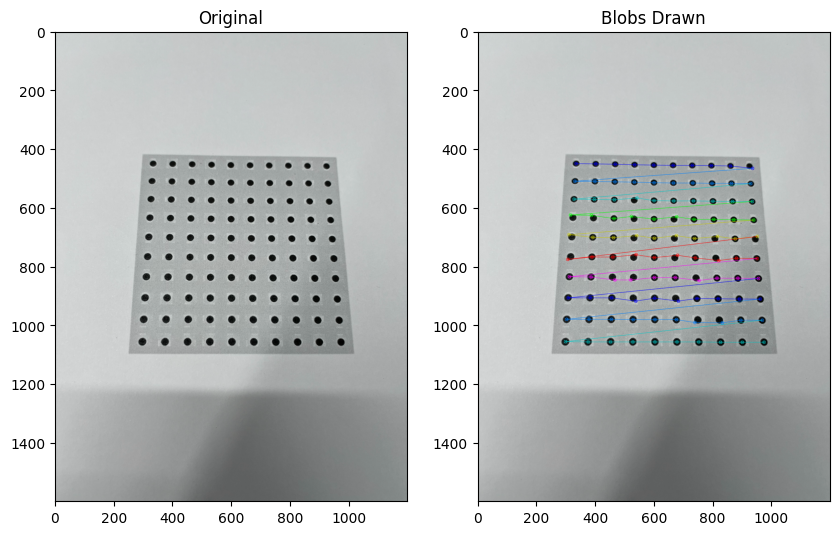

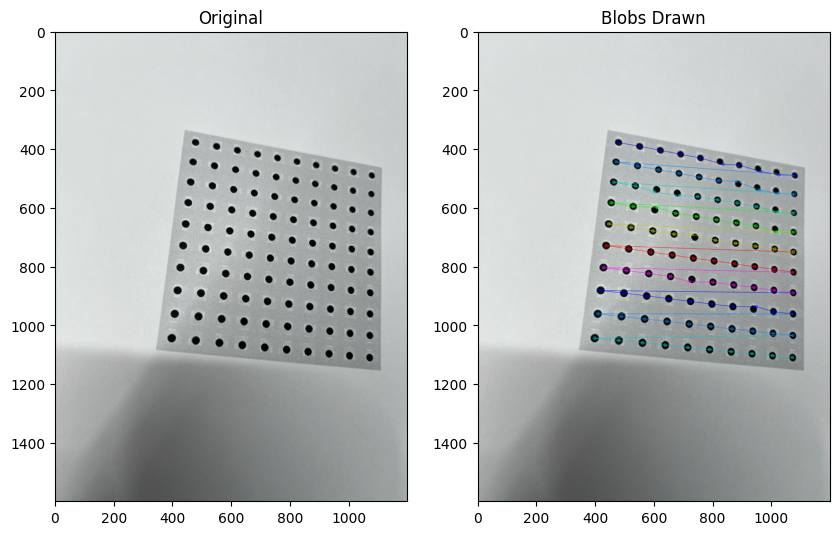

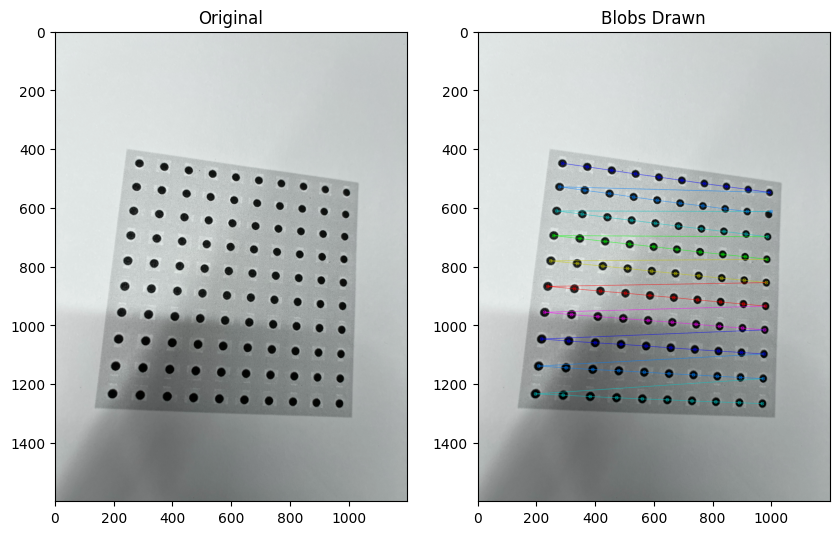

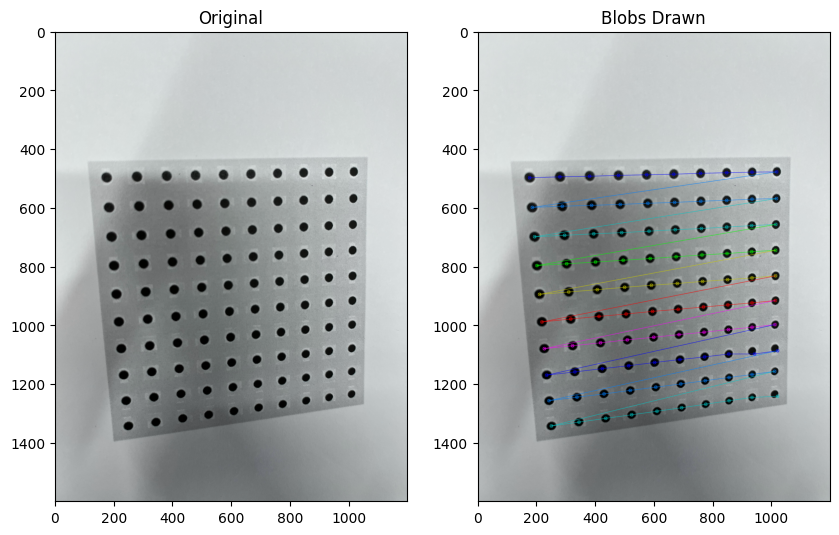

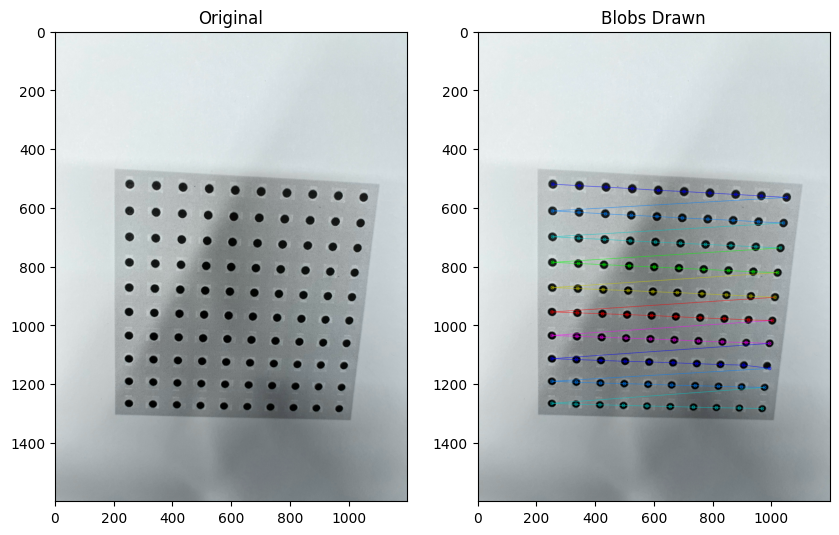

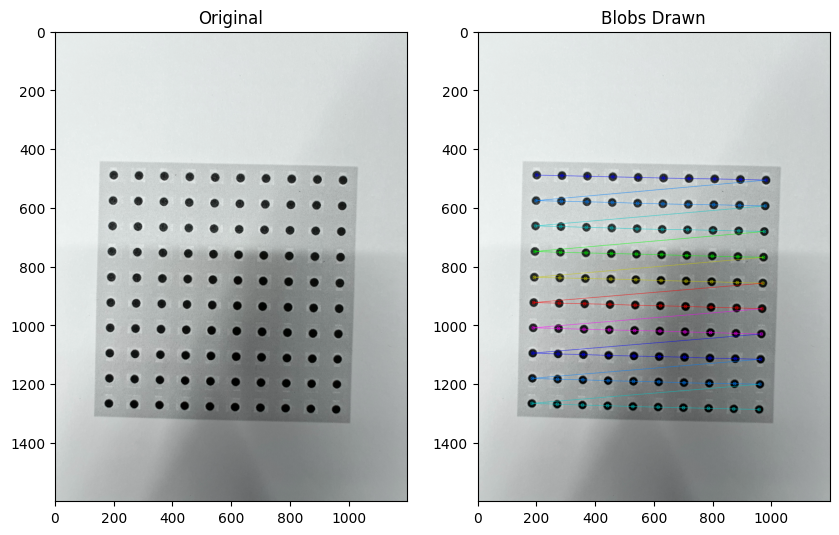

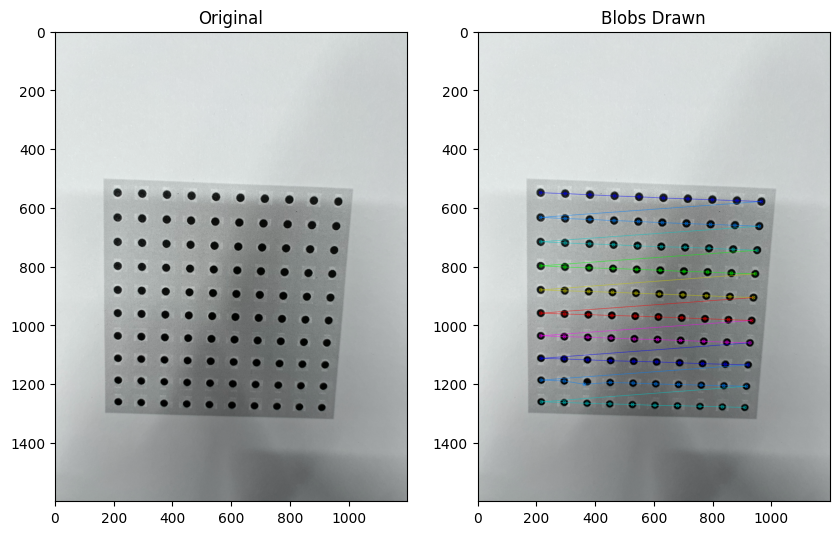

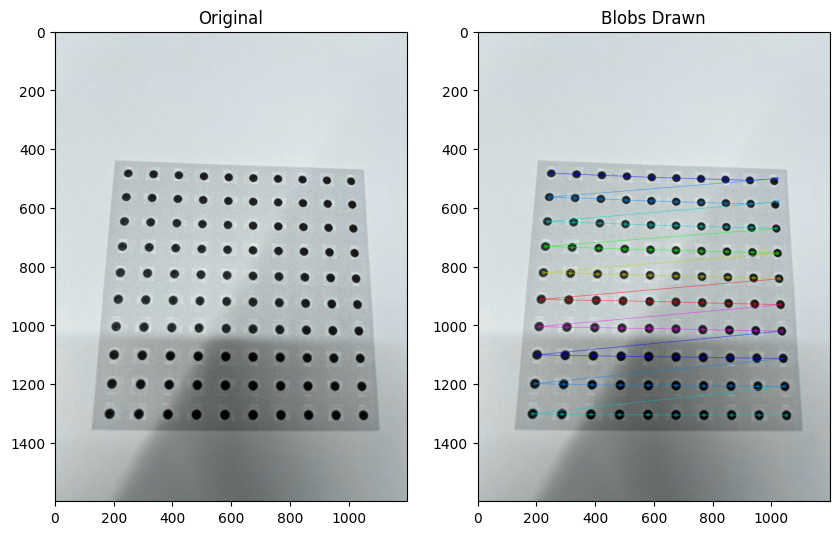

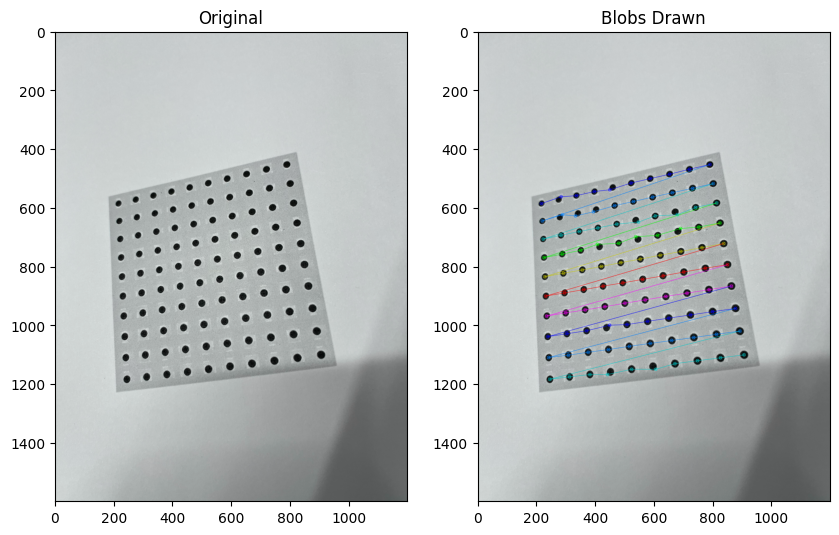

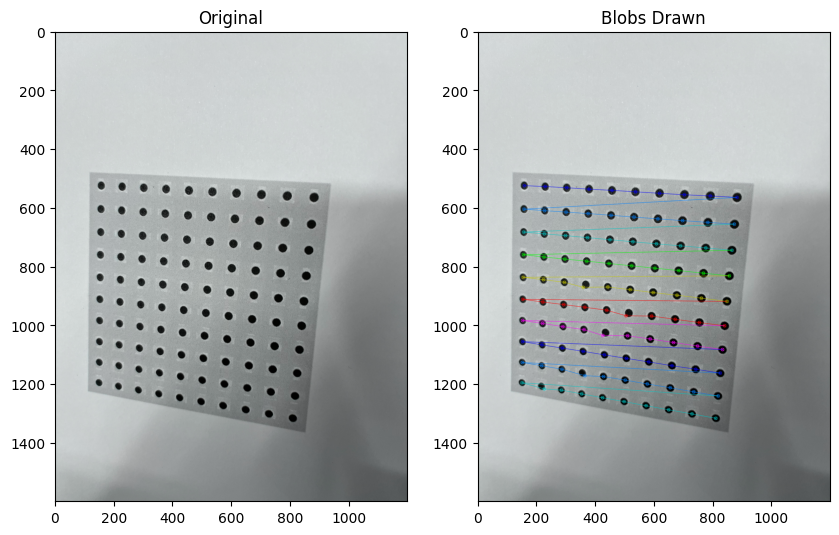

In [58]:
combined_objpts, combined_imgpts = extract_blob_pts(DotGrid_imagepaths)

Using the correspondence above, we calibrate the camera again.

In [59]:
img = cv2.imread(DotGrid_imagepaths[0])
h,w,_ = img.shape
print("Height:", h)
print("Width:", w)

Height: 1600
Width: 1200


In [60]:
yret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(combined_objpts, combined_imgpts, (w,h), None, None)
print(f'The camera matrix is :')    # Camera matrix
for rows in mtx:
    s=""
    for val in rows:
        s+=f'    {val:4.4f}'
    print(s)

print('\n\nThe Distortion parameters are: ')
for i in dist:
    print('\t'.join(map(str, np.round(i,4))))

The camera matrix is :
    1268.5544    0.0000    613.9101
    0.0000    1276.1735    803.0101
    0.0000    0.0000    1.0000


The Distortion parameters are: 
0.1208	-0.7936	-0.0029	0.0041	1.5831


We undistort the images and print them side by side.

In [61]:
# we define the new camera-matrix based on the estimated camera matrix and the distortion parameters
new_camera_mtx, roi = cv2.getOptimalNewCameraMatrix(
    cameraMatrix=mtx,
    distCoeffs=dist,
    imageSize=(w,h),
    alpha=1,
    newImgSize=(w,h)
)

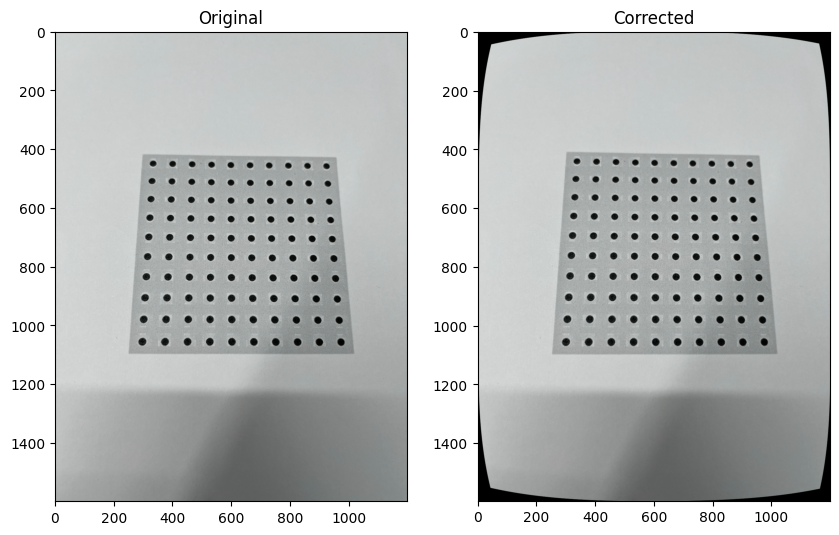

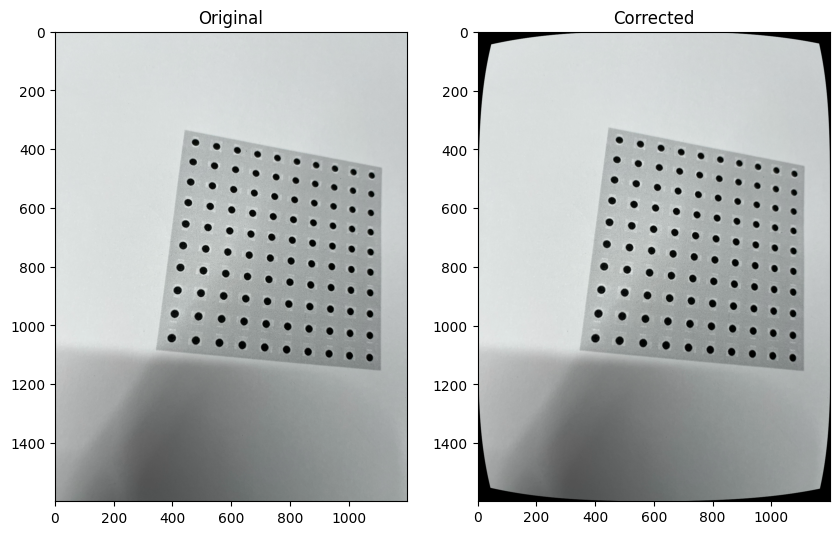

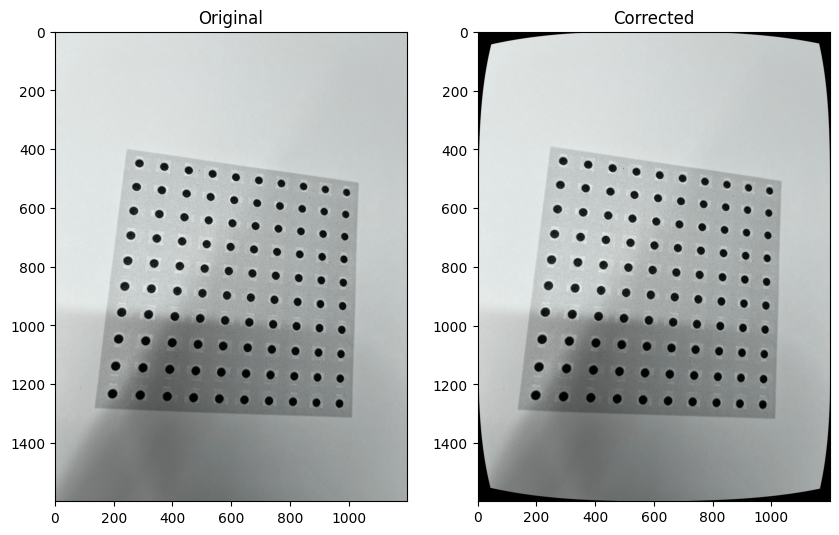

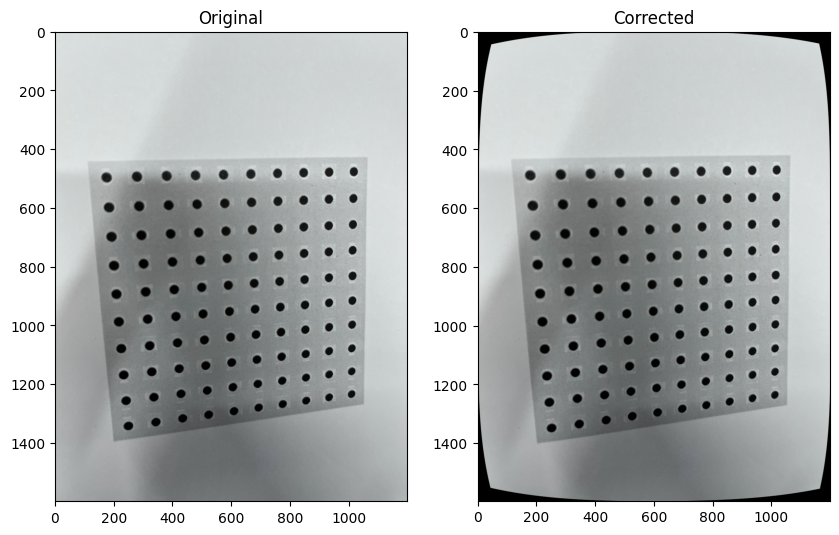

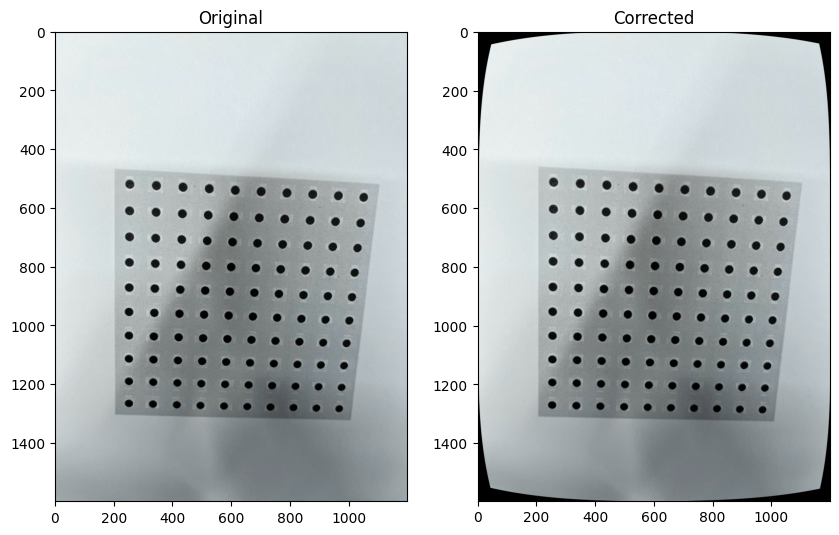

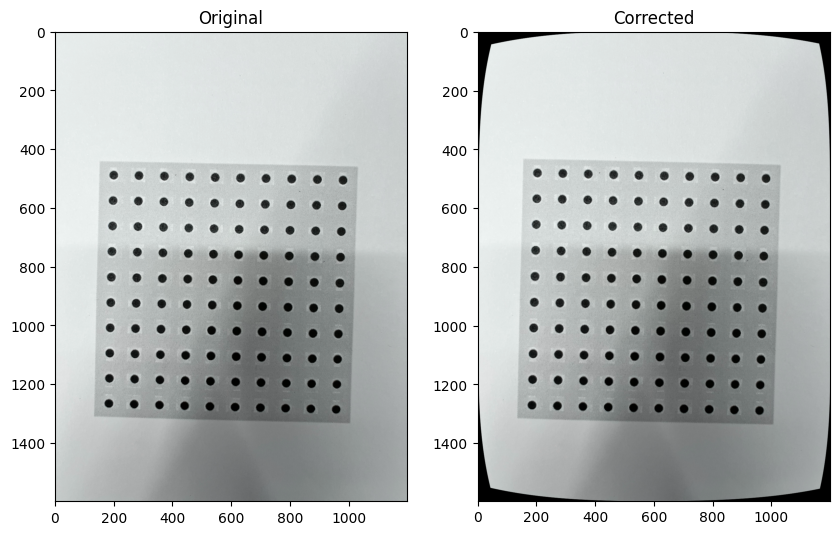

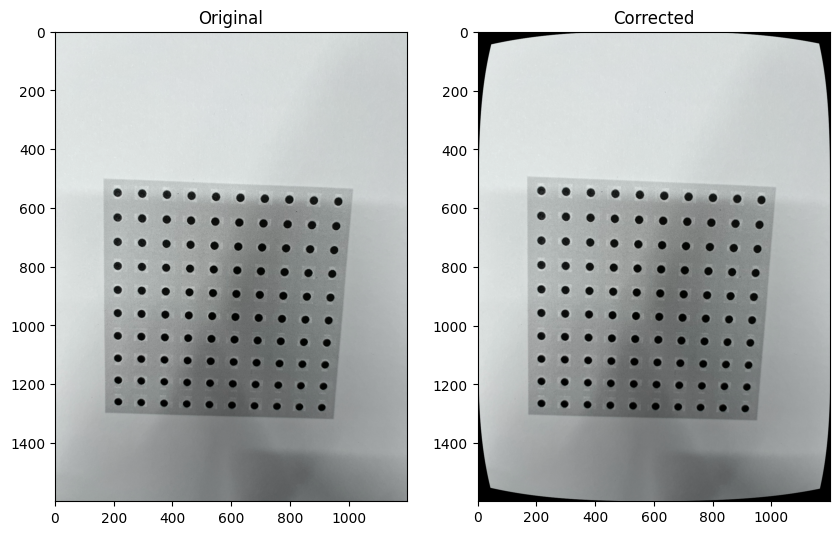

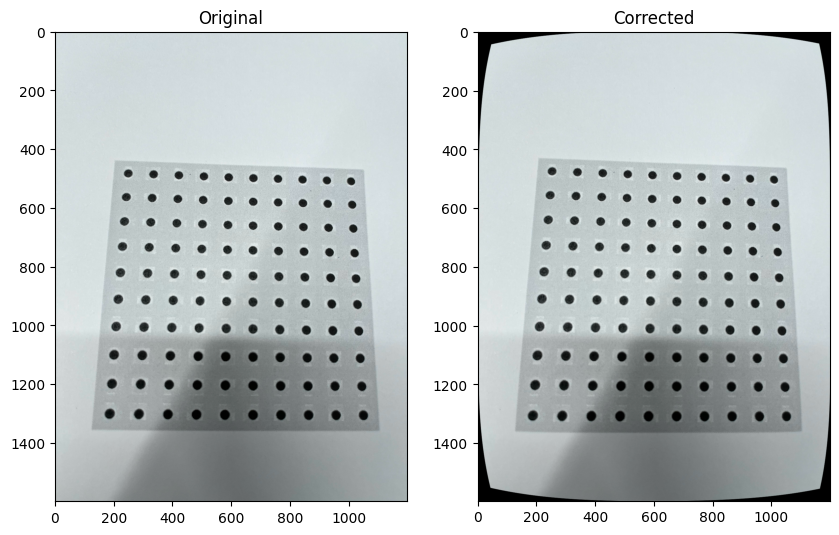

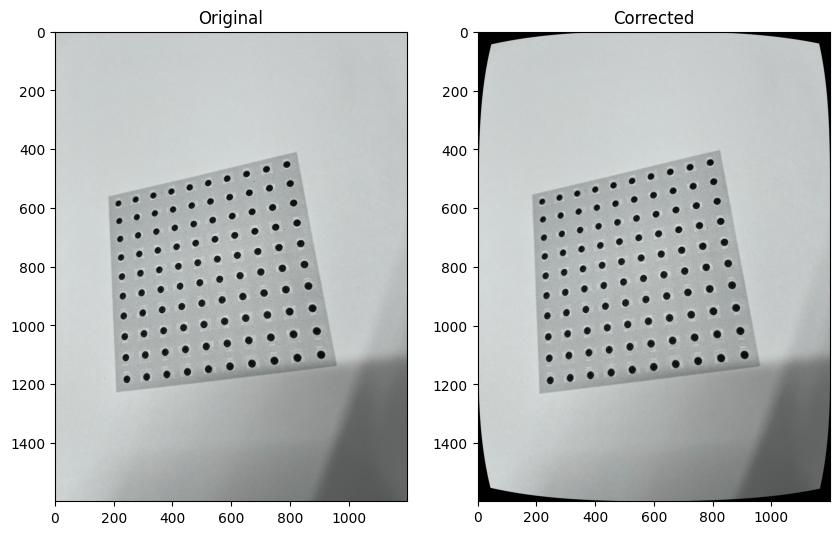

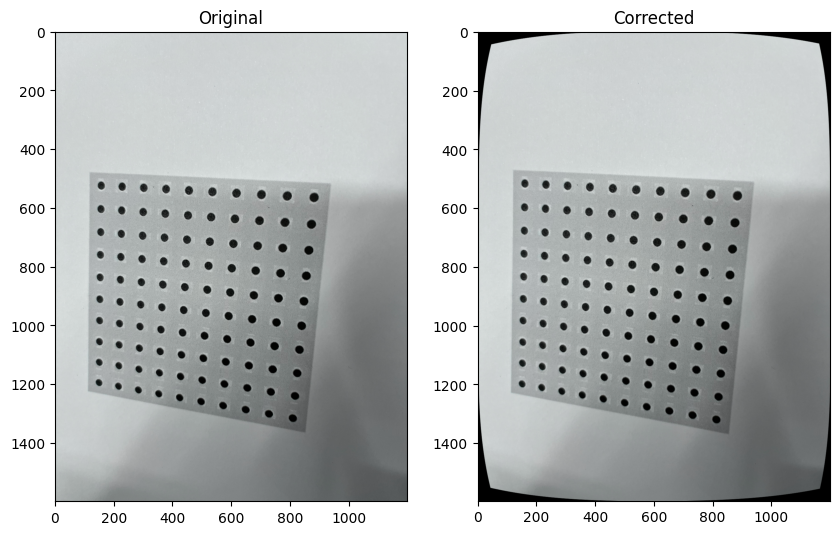

In [62]:
for imgpath in DotGrid_imagepaths:
    img = cv2.imread(imgpath)
    
    # undistorted image
    img_undist = cv2.undistort(img, mtx, dist, None, new_camera_mtx)

    # crop the image
    dx, dy, x, y = roi
    #img_undist = img_undist[dy:dy+y, dx:dx+x]
    img_undist = img_undist[0:dy+y+dy, 0:dx+x+dx]

    # Draw and display original image vs corner drawn image
    plt.figure(figsize=(10,10))
    
    plt.subplot(121)
    plt.imshow(img)
    plt.title("Original")
    
    plt.subplot(122)
    plt.imshow(img_undist)
    plt.title("Corrected")

    plt.show()

We also calculate the mean reprojection error for these.

In [63]:
# mean reprojection error

error_sum = 0

for i in range(len(combined_objpts)):
    imgpt_hat, _ = cv2.projectPoints(combined_objpts[i], rvecs[i], tvecs[i], mtx, dist)

    curr_error = cv2.norm(combined_imgpts[i], imgpt_hat, cv2.NORM_L2)/len(imgpt_hat)

    error_sum += curr_error

print("Mean Reprojection Error:", error_sum/len(combined_objpts))

Mean Reprojection Error: 0.26590171245914124
